In [42]:
# Import the packages

import numpy as np
import math

import gym
from gym import error, spaces, utils
from gym.utils import seeding
from textwrap import dedent

import matplotlib.pyplot as plt

import pprint


In [43]:
# Constants

UP = 0       # North
DOWN = 1     # South
LEFT = 2     # West
RIGHT = 3    # East
GRAB = 4
RELEASE = 5

PACKAGE_CREATION_PROBABILITY = 0.25
TRUCK_DEPART_PROBABILITY = 0.25 # once the loading area has a full stack, a truck departs with this probability (represents the fact that a truck might not be available as soon as the stack is full)

NUM_TRUCKS_TO_FINISH = 10 # episodes finish when this many trucks have departed

REWARD_FULL_LOADING_STACK = 100 # receieve this reward whenever a stack in the loading area is full (and ready to be taken by a truck)
REWARD_WALL_CRASH = -10 # receive this reward if the agent ever crashes into a wall

In [44]:
# Helper function for printing the environments (staging, warehouse, loading)

def print_env(env):
    for x in env:
        print(*x, sep="         ")


In [45]:
# Helper functions for initializing the environments

def create_empty_stack(height):
    s = []
    for i in np.arange(height):
        s.append('.')
    return s

def create_empty_row(width, height):
    s = []
    for i in np.arange(width):
        s.append(create_empty_stack(height))
    return s

def create_empty_env(length, width, height):
    s = []
    for i in np.arange(length):
        s.append(create_empty_row(width, height))
    return s


In [46]:
# Helper function to get a random integer between 1 and upper_bound

def get_random_int(upper_bound):
    return math.ceil(np.random.uniform(0,1) * upper_bound)


In [47]:
# Helper function for creating a new package, uniformly distributed across all package types

def create_package(num_packages):
    return '{}'.format(get_random_int(num_packages))


In [48]:
class Warehouse(gym.Env):
    # Note that a warehouse is composed of 3 sections:
    #    1. The staging area is the first column of the warehouse
    #    2. The loading area is the last column of the warehouse
    #    3. The warehouse area is everything else
    # 
    # A 4 by 6 warehouse looks like this:
    #    S W W W W L
    #    S W W W W L
    #    S W W W W L
    #    S W W W W L
    
    ########################################################################################
    # Gym functions ########################################################################
    ########################################################################################
    
    def __init__(self, length, width, height, num_package_types):
        
        self.length = length
        self.width = width
        self.height = height
        
        self.num_package_types = num_package_types
        
        self.staging_capacity = self.length * self.height # the capacity of the staging area
        self.num_packages_in_staging = 0
        
        self.loading_capacity = self.length * self.height # the capacity of the loading area
        self.num_packages_in_loading = 0
        self.num_full_loading_stacks = 0
        
        # 0 = up, 1 = down, 2 = left, 3 = right, 4 = grab, 5 = release
        self.action_space = spaces.Discrete(6)
        
        # For example, if length = 4, width = 6, and height = 2, then the 
        # observation space looks as follows.
        # ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']
        # ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']
        # ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']
        # ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']         ['.', '.']
        # Each of these .'s could be filled with any number from 0 to num_package_types-1
        self.warehouse_stacks = create_empty_env(self.length, self.width, self.height)
        
        self.crane_x_loc = 0
        self.crane_y_loc = 0
        # I don't track the z location because I always assume that you pick the topmost package and release to the bottommost layer
        
        self.package_held_by_crane = None # the package that the crane is currently holding (a number from 0 to num_package_types-1)
        
        self.state = self.get_state()
        
        self.action_str = None
        
        self.reward = 0
        self.total_reward = 0
        
        self.total_trucks_departed = 0
        self.done = 0
        
        self.info = {}
        
    def step(self, action):
        # Note that every step is composed of 3 sub-steps:
        #     1. Populate packages into the staging area (if there is room)
        #     2. Perform an action (from self.action_space)
        #     3. Full trucks can depart (with probability TRUCK_DEPART_PROBABILITY)
        
        assert self.action_space.contains(action)
        
        self.reward = 0
        self.info = {}
        
        ###############################################################
        # 1. Populate packages into the staging area (if there is room)
        ###############################################################
        
        self.info['a) # packages in staging to start'] = self.num_packages_in_staging
        
        need_package = False
        if self.staging_capacity > self.num_packages_in_staging: # if there is room to add another package
            if np.random.uniform(0,1) < PACKAGE_CREATION_PROBABILITY:
                need_package = True
        
        if need_package:
            # Create the new package at a random y location (as long as there is room)
            y = get_random_int(self.length) - 1 # need to minus 1 since should start at 0
            
            if self.warehouse_stacks[y][0][self.height - 1] == '.': # check the topmost cell --> if empty, then there is room
                self.info['b) # packages created'] = 1
                
                for k in np.arange(self.height):
                    if need_package and self.warehouse_stacks[y][0][k] == '.': # if there is an empty space here
                        self.warehouse_stacks[y][0][k] = create_package(self.num_package_types)
                        
                        need_package = False
                        self.num_packages_in_staging = self.num_packages_in_staging + 1
                
            else:
                self.info['b) # packages created (no room)'] = 0
        
        else:
            self.info['b) # packages created'] = 0
        
        self.info['c) # packages in staging before action'] = self.num_packages_in_staging
        
        ###############################################################
        # 2. Perform an action (from self.action_space)
        ###############################################################
        
        self.info['d) crane location before action'] = 'x = {}, y = {}'.format(self.crane_x_loc, self.crane_y_loc)
        self.info['e) package held by crane before action'] = self.package_held_by_crane
        
        if action == UP:
            self.action_str = 'up'
            self.info['f) action'] = self.action_str
            
            if self.can_move_up():
                self.info['g) action result'] = 'successfully moved up'
                self.crane_y_loc = self.crane_y_loc - 1
                
                self.reward = self.reward - 1
            else:
                self.info['g) action result'] = 'no action'
                
                self.reward = self.reward + REWARD_WALL_CRASH # simulates running into the wall and possibly damaging the crane
        
        elif action == DOWN:
            self.action_str = 'down'
            self.info['f) action'] = self.action_str
            
            if self.can_move_down():
                self.info['g) action result'] = 'successfully moved down'
                self.crane_y_loc = self.crane_y_loc + 1
                
                self.reward = self.reward - 1
            else:
                self.info['g) action result'] = 'no action'
                
                self.reward = self.reward + REWARD_WALL_CRASH # simulates running into the wall and possibly damaging the crane
                
        elif action == LEFT:
            self.action_str = 'left'
            self.info['f) action'] = self.action_str
            
            if self.can_move_left():
                self.info['g) action result'] = 'successfully moved left'
                self.crane_x_loc = self.crane_x_loc - 1
                
                self.reward = self.reward - 1
            else:
                self.info['g) action result'] = 'no action'
                
                self.reward = self.reward + REWARD_WALL_CRASH # simulates running into the wall and possibly damaging the crane
        
        elif action == RIGHT:
            self.action_str = 'right'
            self.info['f) action'] = self.action_str
            
            if self.can_move_right():
                self.info['g) action result'] = 'successfully moved right'
                self.crane_x_loc = self.crane_x_loc + 1
                
                self.reward = self.reward - 1
            else:
                self.info['g) action result'] = 'no action'
                
                self.reward = self.reward + REWARD_WALL_CRASH # simulates running into the wall and possibly damaging the crane
        
        elif action == GRAB:
            self.action_str = 'grab'
            self.info['f) action'] = self.action_str
            
            if self.can_grab():
                self.grab_topmost_package()
                self.info['g) action result'] = 'successfully grabbed package {}'.format(self.package_held_by_crane)
            else:
                if self.package_held_by_crane != None:
                    self.info['g) action result'] = 'cannot grab since holding something else'
                else:
                    self.info['g) action result'] = 'cannot grab since nothing to grab'
            
            self.reward = self.reward - 1
        
        elif action == RELEASE:
            self.action_str = 'release'
            self.info['f) action'] = self.action_str
            
            if self.can_release():
                self.info['g) action result'] = 'successfully released package {}'.format(self.package_held_by_crane)
                self.release_package()
            else:
                if self.package_held_by_crane == None:
                    self.info['g) action result'] = 'cannot release since holding nothing'
                else:
                    self.info['g) action result'] = 'cannot release since stack is full'
            
            self.reward = self.reward - 1
        
        self.info['h) # packages in staging after action'] = self.num_packages_in_staging
        self.info['i) crane location after action'] = 'x = {}, y = {}'.format(self.crane_x_loc, self.crane_y_loc)
        self.info['j) package held by crane after action'] = self.package_held_by_crane
        
        ###############################################################
        # 3. Full trucks can depart
        ###############################################################
        
        self.info['k) # packages in loading before trucks depart'] = self.num_packages_in_loading
        
        cur_full_loading_stacks = 0
        num_trucks_departed = 0
        
        for i in np.arange(self.length):
            if self.warehouse_stacks[i][self.width - 1][self.height - 1] != '.': # if the top of the stack has a package, then it is full
                cur_full_loading_stacks = cur_full_loading_stacks + 1
                
                if np.random.uniform(0,1) < TRUCK_DEPART_PROBABILITY: # is there a truck here to take the packages?
                    num_trucks_departed = num_trucks_departed + 1
                    
                    self.warehouse_stacks[i][self.width - 1] = create_empty_stack(self.height) # clear out the stack
                    self.num_packages_in_loading = self.num_packages_in_loading - self.height # update the number of packages in the loading area
        
        self.info['l) # full loading stacks before trucks depart'] = cur_full_loading_stacks
        
        self.info['m) # departed trucks'] = num_trucks_departed
        
        self.reward = self.reward + (cur_full_loading_stacks - self.num_full_loading_stacks) * REWARD_FULL_LOADING_STACK # +REWARD_FULL_LOADING_STACK for any new full loading stack
        self.num_full_loading_stacks = cur_full_loading_stacks - num_trucks_departed
        
        self.info['n) # packages in loading after trucks depart'] = self.num_packages_in_loading
        self.info['o) # full loading stacks after trucks depart'] = self.num_full_loading_stacks
        
        self.total_trucks_departed = self.total_trucks_departed + num_trucks_departed
        self.info['p) total # full trucks that departed'] = self.total_trucks_departed
        
        self.total_reward = self.total_reward + self.reward
        
        self.done = self.total_trucks_departed >= NUM_TRUCKS_TO_FINISH
        
        self.state = self.get_state()
        
        return self.state, self.reward, self.done, self.info
    
    def reset(self):
        self.__init__(self.length, self.width, self.height, self.num_package_types)
        return self.state
    
    def render(self):
        print()
        print('###########################################################################################')
        print()
        print('info:')
        pprint.pprint(self.info) # prints it nicely
        print()
        print('action = {}'.format(self.action_str))
        print()
        print('crane package = {}'.format(self.package_held_by_crane))
        print()
        print('reward = {}'.format(self.reward))
        print()
        print('total reward = {}'.format(self.total_reward))
        print()
        print('warehouse stacks:')
        print_env(self.warehouse_stacks)
        print()
        print('###########################################################################################')
    
    ########################################################################################
    # Helper functions #####################################################################
    ########################################################################################
    
    def can_move_up(self):
        if self.crane_y_loc - 1 < 0:
            return False
        return True
    
    def can_move_down(self):
        if self.crane_y_loc + 1 > self.length - 1:
            return False
        return True
    
    def can_move_left(self):
        if self.crane_x_loc - 1 < 0:
            return False
        return True
    
    def can_move_right(self):
        if self.crane_x_loc + 1 > self.width - 1:
            return False
        return True
    
    def can_grab(self):
        if self.package_held_by_crane != None: # if the crane is already holding something, then it cannot pick up anything else
            return False
        
        stack_at_crane_loc = self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc]
        if stack_at_crane_loc[0] == '.': # if there is no package in the first layer of this stack, then there is nothing to grab
            return False
        else:
            return True
    
    def grab_topmost_package(self):
        for k in np.arange(self.height)[::-1]: # go in reverse order so we get the topmost package
            if self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc][k] != '.': # if there is a package here
                self.package_held_by_crane = self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc][k]
                self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc][k] = '.'
                
                if self.crane_x_loc == 0: # in staging area
                    self.num_packages_in_staging = self.num_packages_in_staging - 1
                elif self.crane_x_loc == self.width - 1: # in loading area
                    self.num_packages_in_loading = self.num_packages_in_loading - 1
                
                return
    
    def can_release(self):
        if self.package_held_by_crane == None: # if the crane is not holding anything, then there is nothing to release
            return False
        
        stack_at_crane_loc = self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc]
        
        if stack_at_crane_loc[self.height - 1] != '.': # if the stack is full then it cannot release here
            return False
        else:
            return True
        
    def release_package(self):
        for k in np.arange(self.height):
            if self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc][k] == '.': # if there is an empty space here
                self.warehouse_stacks[self.crane_y_loc][self.crane_x_loc][k] = self.package_held_by_crane
                self.package_held_by_crane = None
                
                if self.crane_x_loc == 0: # in staging area
                    self.num_packages_in_staging = self.num_packages_in_staging + 1
                elif self.crane_x_loc == self.width - 1: # in loading area
                    self.num_packages_in_loading = self.num_packages_in_loading + 1
                
                return
    
    def get_state(self):
        # This is a bit confusing, but I am simply trying to map the characteristics of the state space into 
        # indices that can later be used for Q-learning. So, each cell in the warehouse, as well as the x and
        # y locations of the crane, and the package that the crane is holding define the dimensions in the 
        # state space.
        # 
        # The size of the state space is the following:
        # size = 
        #        (num_package_types + 1) ^ (length * width * height)       # every cell in 3-d can be empty or contain a package of any type
        #      * (width * length)                                          # the crane can be anywhere in the x-y plane
        #      * (num_package_types + 1)                                   # the crane can be empty or holding a package of any type
        #
        # Consider the following environment (length = 2, width = 3, height = 2, num_package_types = 1):
        # ['1', '.']         ['1', '1']         ['1', '.']
        # ['1', '.']         ['.', '.']         ['.', '.']
        # with the crane in location (1, 2) and holding no package.
        # 
        # So, there are 2^(2 * 3 * 2) * (3 * 2) * (2) = 49,152 different configurations of this state space.
        # 
        # In this case, get_state() essentially just traverses the warehouse along the length, then the width,
        # then the height, and then looks at the crane's position, and, finally, the package that the crane is
        # holding in order to get the indices. In this case, the indices would be: 
        # (1,1,1,0,1,0,                               # the 1st layer of the warehouse, from top to bottom and then left to right
        #              0,0,1,0,0,0,                   # the 2nd layer of the warehouse, from top to bottom and then left to right
        #                          1,2,               # the crane location
        #                              0)             # the crane is not holding any package
        #
        # Note that the returned tuple is in (length * width * height + 2 + 1)-dimensional space. There is a 
        # hard limit of 32 on the maximum number of dimensions, so make sure we are smaller than this!
        
        # The warehouse
        inds = ()
        for k in np.arange(self.height):
            for j in np.arange(self.width):
                for i in np.arange(self.length):
                    cell_contents = self.warehouse_stacks[i][j][k]
                    if cell_contents == '.':
                        inds = inds + (0,)
                    else:
                        inds = inds + (int(cell_contents),)
        
        # The crane's location
        inds = inds + (self.crane_x_loc, self.crane_y_loc)
        
        # The crane's package
        if self.package_held_by_crane == None:
            inds = inds + (0,)
        else:
            inds = inds + (int(self.package_held_by_crane),)
        
        return inds
        
    def __str__(self):
        print_env(self.warehouse_stacks)
        return ''


In [49]:
########################################################################################
# TESTING ##############################################################################
########################################################################################

length = 3
width = 4 # this should be at least 3 since one column is reserved for staging and one is reserved for loading 
height = 3
num_package_types = 3

print('Initial environment:')
env = Warehouse(length, width, height, num_package_types)
print(env)

# populate the staging area and pick something up
for _ in np.arange(100):
    env.step(GRAB)
env.render()

# move right
for _ in np.arange(10):
    env.step(RIGHT)
env.render()

# release
env.step(RELEASE)
env.render()

# move left
for _ in np.arange(10):
    env.step(LEFT)
env.render()

# pick something up
env.step(GRAB)
env.render()

# move right
for _ in np.arange(10):
    env.step(RIGHT)
env.render()

# release
env.step(RELEASE)
env.render()

# release a bunch of times to make sure enough steps have happened that the truck will depart
for _ in np.arange(100):
    env.step(RELEASE)
env.render()



Initial environment:
['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']
['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']
['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']


###########################################################################################

info:
{'a) # packages in staging to start': 9,
 'b) # packages created': 0,
 'c) # packages in staging before action': 9,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 9,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after t

In [50]:
########################################################################################
# MORE TESTING #########################################################################
########################################################################################

length = 3
width = 4 # this should be at least 3 since one column is reserved for staging and one is reserved for loading 
height = 3
num_package_types = 3

env = Warehouse(length, width, height, num_package_types)
state, reward, done, info = env.step(UP)
state, reward, done, info = env.step(GRAB)
state, reward, done, info = env.step(RIGHT)

env.render()
state


###########################################################################################

info:
{'a) # packages in staging to start': 0,
 'b) # packages created': 0,
 'c) # packages in staging before action': 0,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 0,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -12

warehouse stacks:
['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']         ['.', '.', '.']
['.', '.', '

(0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1)

In [79]:
# Q-learning

##########################################################################
# Load the environment ###################################################
##########################################################################

length = 2
width = 3 # this should be at least 3 since one column is reserved for staging and one is reserved for loading 
height = 2
num_package_types = 2

env = Warehouse(length, width, height, num_package_types)

# Initialize the Q table

# As described above, the size of the state space is:
#    n = (num_package_types + 1) ^ (length * width * height) * (width * length) * (num_package_types + 1)

s = (num_package_types + 1,) * (length * width * height)
s = s + (width, length, num_package_types + 1)
s = s + (env.action_space.n, ) # the last index represents the action

Q = np.zeros(shape=s)

print('The size of the state-action space is {}!'.format(Q.size))

print()
print()
print('The initial state:')
env.render()

##########################################################################
# Perform the Q-learning algorithm #######################################
##########################################################################

epsilon = 0.05   # choose random action with this probability
alpha = 0.65     # learning rate
gamma = 0.9      # discount rate

num_episodes = 10000
max_steps = 100

all_rewards = []

for i in np.arange(num_episodes):
    state = env.reset()
    
    j = 0
    while j < max_steps:
        j = j + 1
        
        # Choose action from Q-table
        
        rand = np.random.uniform(0,1)
        if rand < epsilon: # with probability = epsilon, choose random action
            action = env.action_space.sample()
        else:
            action = np.argmax(Q[state])
        
        # Carry out the action
        
        #print(action)
        next_state, reward, done, info = env.step(action)
        
        # Update the Q-table
        
        Q_target = reward + gamma * np.max(Q[next_state]) # this is the Q-learning part (instead of SARSA)
        Q_delta = Q_target - Q[state][action]
        Q[state][action] = Q[state][action] + alpha * Q_delta
        
        # Update the state
        
        state = next_state
        
        if done:
            break
    
    print()
    print('Episode {}:'.format(i))
    env.render()
    
    all_rewards = all_rewards + [env.total_reward]


The size of the state-action space is 57395628!


The initial state:

###########################################################################################

info:
{}

action = None

crane package = None

reward = 0

total reward = 0

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 0:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # p

Episode 15:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -370

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['2', '.']


action = down

crane package = 2

reward = -1

total reward = -361

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 24:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depar


Episode 37:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -370

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '.']         ['.', '.']

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -334

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 45:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks de


Episode 58:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -325

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '.']         ['.', '.


Episode 70:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -289

warehouse stacks:
['1', '2']         ['2', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

##


Episode 83:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -316

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

#######

Episode 96:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -244

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -316

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 109:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully 


Episode 122:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -334

warehouse stacks:
['1', '1']         ['2', '.']         ['1', '.']
['1', '2']         ['.', '.']     


Episode 132:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -361

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['1

Episode 145:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -316

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['.', '.']      


Episode 158:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -343

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

######


Episode 171:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -10

total reward = -334

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '.']         ['.', '.']

##


Episode 179:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -208

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['.', '.']         [

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -307

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 187:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks b


Episode 195:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '1']         ['1', '.']     


Episode 203:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -307

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '2']  


Episode 211:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -235

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['2', '.']

#


Episode 220:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 2

reward = -1

total reward = -334

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.


Episode 233:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -316

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '1']         ['2', '.']         ['.', '.']

#

 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 242:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) cra


Episode 257:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -190

warehouse stacks:
['2', '1']         ['2', '.']         ['1', '.']
['2', '2']         ['.', '.']         ['


Episode 267:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -244

warehouse stacks:
['2', '2']         ['1', '1']         ['.', '.']
['1', '1']         ['.', '.']         [


Episode 277:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -289

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['2', '2']         ['.', '.'


Episode 287:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -253

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '


Episode 295:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -235

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['


Episode 308:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['2', '1']         ['2', '.']         ['2', '.']
['1', '1']         ['.', '.']  

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 319:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # f

Episode 333:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -325

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['1', '.']


Episode 347:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -108

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -253

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['1', '1']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 360:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 


Episode 373:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -10

total reward = -280

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '.']         ['.', '.']

##


Episode 386:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -135

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '1']
['1', '2']         ['.', '.']         ['.', '.']

#


###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -235

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['2', '.']


Episode 410:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 2

reward = -1

total reward = -235

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '2']         ['.

Episode 422:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -262

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['2', '2']         ['.', '.']        


Episode 432:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']     


Episode 440:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -10

total reward = -370

warehouse stacks:
['1', '1']         ['1', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

##


Episode 451:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -10

total reward = -370

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '.']         ['.', '


Episode 464:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -361

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['1', '.']     


Episode 473:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -298

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']         [


Episode 481:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -235

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 492:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -235

warehouse stacks:
['2', '.']         ['2', '.']         ['.', '.']
['1', '2']         ['1', '.']


Episode 503:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -10

total reward = -126

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

##

Episode 517:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -289

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '.']        

['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 530:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks tha


Episode 544:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -316

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['2', '1']         ['.', '.'

crane package = None

reward = -1

total reward = -334

warehouse stacks:
['2', '1']         ['2', '.']         ['2', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 556:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks d


Episode 569:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -289

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '1']         ['1', '.']         [


Episode 579:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -126

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['1', '.']         ['


Episode 589:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '2']     


Episode 599:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -126

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1


Episode 613:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -289

warehouse stacks:
['1', '1']         ['2', '1']         ['.', '.']
['2', '1']         ['.', '.']         [

 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -298

warehouse stacks:
['2', '2']         ['2', '2']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 628:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packa


Episode 640:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -298

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['2', '.']         ['2', '.'


Episode 653:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -226

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '1']         ['.', '.'


Episode 669:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['2', '.']         ['1', '.']
['1', '2']         ['1', '.']         [

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -334

warehouse stacks:
['1', '1']         ['1', '2']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 681:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) packa


Episode 688:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 1

reward = -1

total reward = -135

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 700:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -244

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']       


Episode 711:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -289

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['1', '1']     

['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 722:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward 


Episode 730:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -181

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['2', '1']         ['


Episode 740:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '.']         [


Episode 753:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = None

reward = -1

total reward = -307

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['2',


Episode 766:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = None

reward = -1

total reward = -162

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '.']  


Episode 777:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -361

warehouse stacks:
['2', '2']         ['1', '.']         ['1', '.']
['1', '2']         ['2', '.']         ['.', '.'

Episode 791:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -208

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.

Episode 802:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -298

warehouse stacks:
['1', '1']         ['2', '1']         ['.', '.']
['2', '1']         ['2', '1']      

Episode 815:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['1', '1']         ['1', '.']
['2', '2']         ['.', '.']         ['.


Episode 826:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -190

warehouse stacks:
['1', '2']         ['1', '.']         ['1', '.']
['1', '1']     


Episode 839:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['1

['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['2', '.']         ['2', '.']

###########################################################################################

Episode 853:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed'


Episode 864:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     


Episode 873:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = None

reward = -1

total reward = -99

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '.']         ['1', '.']   


Episode 885:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -253

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['1', '.']       


Episode 898:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -1

total reward = -198

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '1']

Episode 910:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -280

warehouse stacks:
['1', '2']         ['1', '2']         ['.', '.']
['1', '2']         ['.', '.']         ['1

Episode 920:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -307

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2'


Episode 931:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['1', '.']       

 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -1

total reward = -81

warehouse stacks:
['1', '.']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 943:

######################################

Episode 954:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['

 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -289

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '2']         ['1', '.']

###########################################################################################

Episode 968:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n)

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -162

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 977:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before 


Episode 989:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -99

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['2', '1']         ['.'

 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 1

reward = -1

total reward = -172

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 1003:

####################################

Episode 1011:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -171

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['


Episode 1025:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -316

warehouse stacks:
['1', '1']         ['1', '1']         ['1', '.']
['1', '1']         ['.', '.']         [


Episode 1039:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -334

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

#####


Episode 1048:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -343

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['.', '.']         ['2', '.


Episode 1057:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 1

reward = -1

total reward = -253

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['


Episode 1066:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -316

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['1', '.']         ['.', 


reward = -1

total reward = -226

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 1074:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks de


Episode 1086:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -343

warehouse stacks:
['2', '2']         ['1', '2']         ['.', '.']
['2', '2']         ['2', '.']         ['.', '.


Episode 1094:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = -117

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']    


Episode 1108:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -208

warehouse stacks:
['2', '2']         ['1', '1']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']




Episode 1121:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -334

warehouse stacks:
['2', '2']         ['2', '1']         ['.', '.']
['2', '2']         ['


Episode 1135:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -1

total reward = -63

warehouse stacks:
['2', '.']         ['2', '.']         ['.', '.']
['2', '1']         ['1', '.']         [

 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -63

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 1148:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 

['2', '.']         ['1', '1']         ['.', '.']

###########################################################################################

Episode 1155:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -


Episode 1164:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -244

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['2', '1']         ['2', '.']         


Episode 1178:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -10

total reward = -135

warehouse stacks:
['1', '1']         ['2', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

#####

Episode 1187:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -262

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['2', '.']         ['.', '.']

##

 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 2

reward = -1

total reward = -99

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['.', '.']

###########################################################################################

Episode 1198:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created'

 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 1

reward = -1

total reward = -181

warehouse stacks:
['2', '1']         ['2', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 1211:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully mov


Episode 1220:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -307

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['2', '2']         


Episode 1229:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '2']         


Episode 1237:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -10

total reward = -81

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['2', '.']         ['.', '.']

######

 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = None

reward = -10

total reward = 82

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 1248:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 '


Episode 1259:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -271

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['.', '.']




Episode 1271:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = -54

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']     


Episode 1282:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -181

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['2', '2']         ['1', '.']    


Episode 1290:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -190

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['2', '.']         ['2', 

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -289

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 1298:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks befor


Episode 1310:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -262

warehouse stacks:
['1', '2']         ['1', '.']         ['2', '.']
['1', '1']         ['2', '.']         ['.', '.

 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -316

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 1324:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # 


Episode 1334:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -235

warehouse stacks:
['1', '1']         ['2', '1']         ['2', '.']
['1', '1']         ['.', '.']         ['.', '.']




Episode 1344:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -1

total reward = -90

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['2', '

 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -208

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 1356:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) cran

['2', '2']         ['1', '1']         ['2', '.']

###########################################################################################

Episode 1367:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 2

reward = 


Episode 1377:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -199

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['2', '2']         ['.', 

 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -10

total reward = -99

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 1391:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane loc


Episode 1401:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -244

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '2']         ['.', 

 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -280

warehouse stacks:
['2', '1']         ['1', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 1412:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action


Episode 1423:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['2', '2']         ['1', '2']      


Episode 1436:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -289

warehouse stacks:
['1', '2']         ['2', '.']         ['2', '.']
['2', '2']         ['1', '.']         ['.', '.


Episode 1450:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 1

reward = -1

total reward = -217

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['2', '2']         ['.', '.']         

{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['2', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 1462:

#


Episode 1472:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -226

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['1', '1']         ['.', '.']      


Episode 1485:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -343

warehouse stacks:
['2', '.']         ['1', '.']         ['.', '.']
['1', '1']         ['1', '1']         ['.', '

Episode 1497:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -45

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '2']         ['1', '.']         ['.', '.


Episode 1508:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -190

warehouse stacks:
['1', '2']         ['2', '2']         ['.', '.']
['1', '1']         ['.', '.']      


Episode 1518:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -208

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '2']         ['2', '2']    


Episode 1531:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 2

reward = -1

total reward = -36

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['1', '.']         [


Episode 1542:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -343

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['1', '2']         ['2', '.']         [


Episode 1554:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -199

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['2', '1']         ['1', '.']    

Episode 1562:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -253

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['1', '.']         ['.', '.']

######


Episode 1573:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['.', '.'] 


Episode 1581:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -217

warehouse stacks:
['2', '1']         ['2', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.


Episode 1589:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -280

warehouse stacks:
['1', '2']         ['2', '.']         ['1', '.']
['1', '2']         ['1', '.']         [


Episode 1599:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '.']         ['.', '.']        


Episode 1612:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -226

warehouse stacks:
['2', '2']         ['1', '1']         ['1', '.']
['2', '2']         ['.', '.']         [

['2', '2']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 1621:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -


Episode 1633:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -325

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.


Episode 1645:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -244

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '2']         ['.', '.']

#


Episode 1653:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 2

reward = -1

total reward = -54

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '.']         [


Episode 1664:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -253

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '.'] 


Episode 1679:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 1

reward = -1

total reward = -199

warehouse stacks:
['2', '2']         ['1', '1']         ['.', '.']
['1', '1']         ['


warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 1687:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) t

Episode 1699:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -217

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '1']     


Episode 1710:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -172

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '1']         ['


Episode 1722:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -10

total reward = -81

warehouse stacks:
['2', '1']         ['2', '2']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

######

Episode 1734:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -316

warehouse stacks:
['1', '1']         ['1', '2']         ['.', '.']
['2', '2']     


Episode 1747:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -217

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['


Episode 1758:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -27

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']         ['

Episode 1768:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -253

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['1', '1']         ['.', '.']

#


Episode 1783:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -235

warehouse stacks:
['1', '2']         ['2', '2']         ['.', '.']
['1', '.']         ['.', '.']         ['1', 


Episode 1795:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -10

total reward = -144

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']         ['1', '.


Episode 1806:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 2

reward = -1

total reward = -72

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['2', '.']         ['.', '.']  

Episode 1816:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -127

warehouse stacks:
['2', '1']         ['1', '.']         ['2', '.']
['1', '1']         ['.', '.']         [

{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -199

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['2', '1']         ['.', '.']

######################################################################################


Episode 1838:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -90

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['1', '2']     

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['1', '.']

###########################################################################################

Episode 1851:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) pa


Episode 1863:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['2', '1']         ['2', '.']         ['1', '.']
['2', '2']         ['1', '.']         ['.', 


Episode 1874:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -253

warehouse stacks:
['1', '2']         ['2', '.']         ['1', '.']
['1', '1']         ['.', '.']         


Episode 1886:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -298

warehouse stacks:
['2', '1']         ['2', '1']         ['.', '.']
['2', '1']         ['1', '.']         ['2', '.']



['2', '2']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 1894:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None


Episode 1906:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 2

reward = -1

total reward = -126

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['2', '1']         ['2', '.']      

 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -190

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '1']         ['2', '.']

###########################################################################################

Episode 1918:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed truc


Episode 1932:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -289

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '1']         


Episode 1945:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 2

reward = -1

total reward = -27

warehouse stacks:
['1', '1']         ['1', '.']         ['2', '.']
['1', '.']         ['.', '.']         [


Episode 1958:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -1

total reward = -72

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['.', '


Episode 1971:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -163

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '2']    


Episode 1984:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -10

total reward = -226

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']



Episode 1996:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -253

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '.']      


Episode 2007:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -190

warehouse stacks:
['1', '2']         ['1', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

#


Episode 2017:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -10

total reward = -316

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

#


Episode 2028:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -10

total reward = -225

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '1']
['2', '1']         ['1', '.']         ['.', '.']



Episode 2041:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -10

total reward = 128

warehouse stacks:
['2', '1']         ['2', '.']         ['2', '.']
['2', '.']         ['.', '.']         ['.', '.']

#######


Episode 2053:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -181

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '.']      

Episode 2065:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.

Episode 2076:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -135

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']     


Episode 2089:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 1

reward = -1

total reward = -27

warehouse stacks:
['2', '2']         ['2', '.']         ['1', '.']
['1', '1']         ['.', '.']       


Episode 2099:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = None

reward = -1

total reward = -117

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['2', '1']         ['1', '.'] 

Episode 2110:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -262

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['1', '2']         ['.', '.']         [


Episode 2121:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['1', '1']    

 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['1', '.']         ['2', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2133:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane lo


Episode 2144:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = -171

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['1', '2']         ['2', '1']    


Episode 2155:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -307

warehouse stacks:
['2', '1']         ['2', '2']         ['.', '.']
['1', '2']         ['2', '.']         [


Episode 2167:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -253

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['1', '1']         ['1', '1']         ['.', '.

 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = None

reward = -1

total reward = -208

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['2', '2']         ['1', '.']

###########################################################################################

Episode 2177:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # p


Episode 2187:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = 64

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1


Episode 2200:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -262

warehouse stacks:
['1', '1']         ['1', '1']         ['.', '.']
['2', '1']         ['2', '.']         

Episode 2213:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -99

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['2', '.

Episode 2225:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -72

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '.']   


Episode 2236:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -10

total reward = -72

warehouse stacks:
['1', '.']         ['2', '1']         ['.', '.']
['2', '2']         ['2', '.']         ['.', '.']

#


Episode 2248:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '2']         ['

Episode 2256:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '.']         [

 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 2

reward = -1

total reward = -63

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '1']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 2267:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # 


Episode 2277:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -280

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['1', '2']    


Episode 2288:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '1']         

reward = -1

total reward = -108

warehouse stacks:
['2', '2']         ['1', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2299:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks dep

Episode 2310:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = None

reward = -1

total reward = 55

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['1', '1']         ['.'

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -1

total reward = -81

warehouse stacks:
['2', '1']         ['1', '2']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2323:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package he

Episode 2333:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = -17

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '2']         ['1', '.']      


Episode 2344:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -226

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['1', 


Episode 2356:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 2

reward = -10

total reward = -36

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '1']         ['.', '.']

##

###########################################################################################

Episode 2369:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -289

warehouse sta


Episode 2381:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = -8

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['2', '.']         ['.', '.']      

total reward = -154

warehouse stacks:
['2', '2']         ['1', '2']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2396:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks 


Episode 2406:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -1

total reward = -99

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['2', '.']         ['2', '

 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['2', '.']         ['2', '.']
['2', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 2417:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # package

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -253

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 2432:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,


 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -253

warehouse stacks:
['2', '2']         ['2', '1']         ['.', '.']
['1', '2']         ['1', '2']         ['.', '.']

###########################################################################################

Episode 2444:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in stagi


Episode 2453:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['1', '2']         ['.', '.']
['1', '1']         ['.', '.']    

 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -199

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '2']         ['.', '.']

###########################################################################################

Episode 2461:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # pa


Episode 2472:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -316

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '2']    

Episode 2482:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 164

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']        

['1', '2']         ['2', '.']         ['2', '.']

###########################################################################################

Episode 2494:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = None

rewa

 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -253

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '2']         ['.', '.']

###########################################################################################

Episode 2504:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # pa


Episode 2515:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -10

total reward = -135

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '1']         ['2', '.']

#####

action = release

crane package = None

reward = -1

total reward = 91

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 2530:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading 


Episode 2541:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -244

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['1', '1']         ['1', '.'] 


Episode 2554:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = 1

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '


Episode 2565:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 1

reward = -1

total reward = -262

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['1', '2']         ['


Episode 2578:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -217

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '.']    


reward = -1

total reward = -8

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 2590:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks


Episode 2601:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -289

warehouse stacks:
['2', '1']         ['1', '1']         ['2', '.']
['2', '1']         ['.', '.']    


Episode 2612:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -289

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['2', '2']      


Episode 2624:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -298

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['2', '2'] 


Episode 2636:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -63

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         [


Episode 2649:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = 73

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']      


Episode 2661:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -280

warehouse stacks:
['2', '1']         ['1', '.']         ['1', '.']
['2', '1']         ['1', '.']         ['.', '.']

#

 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -307

warehouse stacks:
['2', '.']         ['2', '2']         ['2', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2669:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,



Episode 2679:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -226

warehouse stacks:
['1', '1']         ['1', '2']         ['.', '.']
['1', '.']         ['1', '.']      


Episode 2692:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -180

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['2', '1']    


Episode 2706:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 2

reward = -1

total reward = -181

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['2', '1']         ['

 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 1

reward = -1

total reward = -226

warehouse stacks:
['2', '1']         ['1', '2']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 2719:

###########################################################################################

info:
{'a) # packa


Episode 2732:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -10

total reward = -298

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['2', '1']         ['1', '.']         ['2', '.']

#


Episode 2744:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 2

reward = -1

total reward = -81

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '.']         [


Episode 2755:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -262

warehouse stacks:
['1', '1']         ['2', '1']         ['.', '.']
['1', '2']         ['.', '.']    

 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -226

warehouse stacks:
['1', '2']         ['2', '2']         ['.', '.']
['1', '1']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 2766:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f


Episode 2778:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -63

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['1', '2']         ['

Episode 2790:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -117

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['2', '2']         ['1', '.']         ['


Episode 2802:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -99

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['2', '

 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 2

reward = -1

total reward = -81

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '1']         ['.', '.']

###########################################################################################

Episode 2811:

###########################################################################################

info:
{'a) 


Episode 2825:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -298

warehouse stacks:
['2', '1']         ['2', '1']         ['.', '.']
['2', '1']         ['.', '.']         ['.', 


Episode 2834:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -181

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '1']         ['2', '2']         ['.', '.']

#####

Episode 2842:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -10

total reward = -226

warehouse stacks:
['2', '2']         ['1', '1']         ['.', '.']
['1', '2']         ['1', '.']         ['.', '.']




Episode 2853:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['1'


Episode 2861:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -325

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '1']         ['1', '2']         ['1', '.


Episode 2869:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = None

reward = -1

total reward = -26

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['

Episode 2882:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 2

reward = -1

total reward = 46

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['.', '.']         ['.', '.']         ['.


Episode 2891:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -235

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '2']         ['


Episode 2906:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -144

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '.'] 


Episode 2920:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -235

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['1', '1']         ['1', '1']         ['.', '.']

#####


Episode 2929:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -10

total reward = -90

warehouse stacks:
['2', '2']         ['1', '.']         ['1', '.']
['1', '1']         ['1', '.']         ['.', '.'

Episode 2943:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = 99

total reward = 19

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['2', '2']         ['.'


Episode 2952:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = 55

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '.']      


Episode 2964:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = None

reward = -1

total reward = 55

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['1', '2']         ['.

['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 2972:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

cran


Episode 2985:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -253

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['1', '.']

#

Episode 2997:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = 28

warehouse stacks:
['1', '1']         ['1', '.']         ['1', '.']
['2', '2']         ['1', '.']       

Episode 3010:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = 2

reward = -1

total reward = -117

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['1


Episode 3018:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -253

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '1']         ['2', '2']      


Episode 3026:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -10

total reward = -198

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']



{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -289

warehouse stacks:
['1', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 3041:

#


Episode 3056:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -108

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['.', '.']         

total reward = -244

warehouse stacks:
['1', '1']         ['1', '2']         ['1', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3070:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks de


Episode 3083:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -1

total reward = -54

warehouse stacks:
['2', '2']         ['1', '1']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '


Episode 3091:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -199

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['1', '2']         ['


Episode 3100:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -262

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['1', '2']         ['1', '2']      

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -10

total reward = 1

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 3113:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stac


Episode 3127:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '2']         ['2', '.']    

 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -289

warehouse stacks:
['2', '.']         ['1', '1']         ['.', '.']
['2', '1']         ['1', '.']         ['2', '.']

###########################################################################################

Episode 3136:

############################


Episode 3143:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 2

reward = -1

total reward = -144

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['


Episode 3157:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -72

warehouse stacks:
['1', '.']         ['2', '1']         ['.', '.']
['2', '1']         ['.', '.'] 


Episode 3170:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['1', '2']         ['2', '1']      


Episode 3178:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['2', '.'] 


Episode 3186:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = None

reward = -1

total reward = -117

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['1', '2']         ['2', '.'] 

Episode 3199:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 2

reward = -10

total reward = -81

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '2']         ['.', '.']

###


Episode 3207:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -253

warehouse stacks:
['2', '2']         ['2', '.']         ['1', '.']
['2', '2']         ['.', '.']    


Episode 3220:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


Episode 3233:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['1', '2']        


Episode 3241:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -118

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

#####


Episode 3255:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -18

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         [


Episode 3269:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -90

warehouse stacks:
['2', '1']         ['2', '2']         ['.', '.']
['2', '1']         ['

{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -1

total reward = -99

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['1', '.']         ['1', '.']

###########################################################################################

Episode 3279:

##

Episode 3291:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -208

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '2']         ['2', '.']     

 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = 64

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['2', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 3305:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) 


Episode 3313:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = 1

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['2', '1']         ['


Episode 3321:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -189

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', 


Episode 3334:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -181

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '1']         ['2', '2']    


Episode 3347:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -343

warehouse stacks:
['2', '2']         ['1', '.']         ['1', '.']
['2', '2']         ['2', '.']    

 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -181

warehouse stacks:
['1', '1']         ['1', '1']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 3362:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane locatio

Episode 3373:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -280

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['1', '1']         ['.', '.']     


Episode 3389:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -10

total reward = -316

warehouse stacks:
['1', '1']         ['1', '1']         ['.', '.']
['1', '2']         ['2', '2']         ['.', '.

 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -1

total reward = -126

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['2', '.']

###########################################################################################

Episode 3399:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks 


Episode 3411:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = down

crane package = 2

reward = -1

total reward = 28

warehouse stacks:
['1', '.']         ['1', '.']         ['.', '.']
['1', '2']         ['2', '1']         ['


Episode 3425:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 1

reward = -1

total reward = -180

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', 


Episode 3438:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

crane package = None

reward = -1

total reward = 64

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['2', '2']         ['2', 

 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -10

total reward = -90

warehouse stacks:
['2', '1']         ['2', '1']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3451:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) c


Episode 3464:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['2', '1']         ['2', '1']         ['.', '.']
['2', '1']         ['.', '.']         ['

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['1', '1']         ['1', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3473:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2


Episode 3480:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['2', '2']         ['.', '.']
['2', '1']         ['2', '1']         

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 173

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3489:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',


 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -10

total reward = -253

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 3501:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully mov


Episode 3514:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 264

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']  

Episode 3527:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -1

total reward = -217

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '.']         ['.', '.']         ['1', '

Episode 3539:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -199

warehouse stacks:
['2', '1']         ['1', '1']         ['.', '.']
['2', '2']         ['2', '.']         ['

Episode 3553:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 37

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '2']         

Episode 3562:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -1

total reward = -298

warehouse stacks:
['1', '1']         ['1', '1']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '

['2', '1']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3571:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # 


Episode 3579:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -1

total reward = -171

warehouse stacks:
['1', '2']         ['1', '2']         ['.', '.']
['1', '2']         ['1', '.']         


Episode 3590:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '2']         ['1', '2']         [


Episode 3604:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -72

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '2']     

Episode 3617:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -36

warehouse stacks:
['1', '1']         ['2', '.']         ['2', '.']
['2', '1']      


Episode 3629:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = -17

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']       

 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 3644:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane lo


Episode 3656:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = 82

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['1', '1']      


Episode 3669:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -153

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['2', 

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3677:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # pac


Episode 3690:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 1

reward = -1

total reward = 200

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '

Episode 3702:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 246

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['2


Episode 3710:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = 2

reward = -1

total reward = -171

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['2', '2']         ['


Episode 3724:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -253

warehouse stacks:
['2', '1']         ['1', '1']         ['1', '.']
['2', '2']         ['.', '.']         ['.', '.']

#####

 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = 1

reward = -1

total reward = 73

warehouse stacks:
['2', '2']         ['2', '1']         ['2', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 3738:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 '


Episode 3745:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 2

reward = -1

total reward = 46

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['.', '.']         ['.', '.']         ['

 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -235

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['2', '2']         ['1', '.']

###########################################################################################

Episode 3759:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before actio

Episode 3766:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 2

reward = -10

total reward = -108

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['2', '.']




Episode 3774:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -1

total reward = -307

warehouse stacks:
['1', '1']         ['2', '1']         ['.', '.']
['2', '2']         ['2', '2']    

Episode 3790:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -81

warehouse stacks:
['2', '1']         ['1', '2']         ['.', '.']
['2', '1']      


Episode 3798:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -1

total reward = -36

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '1']         ['1', '1']     


Episode 3806:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 1

reward = -1

total reward = -235

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '1']         ['2', '1']         


Episode 3820:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '1']
['1', '2']     


Episode 3833:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = None

reward = -1

total reward = -72

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['1', '1']         ['1',


Episode 3841:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '2']      


Episode 3855:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

crane package = 1

reward = -1

total reward = 19

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']   


Episode 3863:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 2

reward = -1

total reward = -253

warehouse stacks:
['2', '1']         ['2', '2']         ['1', '.']
['2', '1']         ['.', '.']         


Episode 3871:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['1


Episode 3884:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -190

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '2']         ['1', '.']         

Episode 3898:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.'


Episode 3906:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']     

Episode 3918:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['


Episode 3926:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['2', '2']         ['2', '.']
['1', '1']         ['.', '.']         [


Episode 3939:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 146

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '2']
['1', '2']         ['.', '.']       

Episode 3958:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = 64

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['2', '1']         ['2'


Episode 3973:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     

Episode 3988:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -10

total reward = -54

warehouse stacks:
['1', '2']         ['2', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['1', '.']


Episode 4001:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = None

reward = -10

total reward = -189

warehouse stacks:
['1', '2']         ['2', '.']         ['2', '.']
['1', '1']         ['2', '.']         ['.', '.

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -172

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4013:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages 


Episode 4020:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = down

crane package = 1

reward = -1

total reward = 28

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['


Episode 4034:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['1', '.']         ['.', '.']
['2', '2']         ['.', '.']       


Episode 4042:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

crane package = 2

reward = -1

total reward = 46

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']   

Episode 4056:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '1']
['2', '1']      

Episode 4068:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']      


Episode 4076:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['2', '.']         ['.', '.']
['2', '2']         ['.


Episode 4084:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -36

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['1', '.']         ['2', '2']         ['.', '


Episode 4099:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -99

warehouse stacks:
['1', '.']         ['1', '.']         ['1', '.']
['2', '1']         ['


Episode 4108:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 1

reward = -1

total reward = 82

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']         ['

 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = 1

reward = -10

total reward = 46

warehouse stacks:
['1', '1']         ['1', '2']         ['.', '.']
['2', '.']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 4123:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action':


Episode 4136:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '


Episode 4149:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 55

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']        


Episode 4161:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = release

crane package = None

reward = -1

total reward = -163

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['1', '1']    


Episode 4171:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = up

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['


Episode 4179:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -1

total reward = -126

warehouse stacks:
['1', '.']         ['1', '2']         ['.', '.']
['1', '1']         ['.', '.']    

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 128

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4187:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks dep


Episode 4201:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 10

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']        


total reward = -108

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 4210:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks afte

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 164

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 4225:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, 

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -253

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 4237:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package h


Episode 4244:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -10

total reward = -289

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['2', 

 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -208

warehouse stacks:
['1', '1']         ['2', '1']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4253:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages cr


crane package = None

reward = -1

total reward = 264

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '1']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4266:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # fu

 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4280:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages 


reward = -1

total reward = 46

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['2', '2']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 4293:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks


Episode 4306:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['1', '.']         ['1', '.']
['2', '2']         ['2', '1']         [


Episode 4315:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = None

reward = -10

total reward = -153

warehouse stacks:
['2', '1']         ['2', '2']         ['.', '.']
['2', '.']         ['1', '.']         ['.', '.']



 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = 1

reward = -1

total reward = 128

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4325:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created'


Episode 4334:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 2

reward = -1

total reward = -217

warehouse stacks:
['2', '1']         ['1', '2']         ['.', '.']
['2', '1']         ['.', '.']         


Episode 4348:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 2

reward = -10

total reward = -126

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['2', '2']         ['.', '.']

#####


Episode 4356:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         [

 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 4372:

###################


Episode 4384:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = None

reward = -1

total reward = -190

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['1', '1']         ['.', '.'] 


Episode 4393:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']     

Episode 4407:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']      

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -1

total reward = -244

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '2']         ['1', '.']         ['1', '.']

###########################################################################################

Episode 4421:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks b


Episode 4434:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       


Episode 4443:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = down

crane package = 2

reward = -1

total reward = 55

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['

Episode 4451:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']   


Episode 4464:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 37

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']        


Episode 4472:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = None

reward = -10

total reward = -235

warehouse stacks:
['1', '1']         ['2', '2']         ['2', '.']
['2', '1']         ['.', '.']         ['1', '.

Episode 4485:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 1

reward = -1

total reward = -27

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '1']         ['.'


Episode 4500:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -1

total reward = -172

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '2']         


Episode 4515:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.

reward = -1

total reward = -17

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4528:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full

 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 4543:

##########################################

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 4558:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading st


Episode 4574:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['2', '.']         ['


Episode 4582:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = down

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         [

reward = -1

total reward = 55

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4597:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks 


Episode 4605:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


Episode 4619:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 155

warehouse stacks:
['1', '.']         ['2', '2']         ['.', '.']
['1', '.']         ['.', '.']  

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4635:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before t


Episode 4650:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']  


Episode 4658:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     


Episode 4672:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 4680:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 2

reward = -1

total reward = -271

warehouse stacks:
['1', '2']         ['1', '1']         ['1', '.']
['1', '1']         ['2', '.']      


Episode 4693:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = 99

total reward = -26

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['

Episode 4707:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 173

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']        


Episode 4715:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 1

reward = -1

total reward = -72

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '.']         [


Episode 4724:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '

 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4738:

#############################################################


Episode 4745:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']     


Episode 4758:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 119

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

Episode 4771:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = 2

reward = -1

total reward = -90

warehouse stacks:
['2', '.']         ['2', '.']         ['.', '.']
['1', '1']         ['2', '2'] 


Episode 4784:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = right

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']  


Episode 4792:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 364

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']     

 'p) total # full trucks that departed': 4}

action = up

crane package = 2

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 4800:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departe


Episode 4808:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']     


Episode 4821:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']     


Episode 4829:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '1']
['1', '1']         ['


Episode 4837:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 173

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']     

Episode 4848:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']      


Episode 4863:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -226

warehouse stacks:
['1', '2']         ['2', '.']         ['2', '.']
['2', '2']         ['1', '.']         ['.', '.']

#####


Episode 4871:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '1']
['1', '1']         ['

Episode 4885:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']      

Episode 4898:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 137

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']      

Episode 4911:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = 1

reward = -10

total reward = 364

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '.']         ['.', '.']         ['.', '.']

#######


Episode 4926:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 1

reward = -1

total reward = -153

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']      

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4934:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) to

['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 4948:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full truck

 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 291

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '2']

###########################################################################################

Episode 4960:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) 


Episode 4972:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['


Episode 4986:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = grab

crane package = 2

reward = -1

total reward = -99

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['1', '.']  

Episode 5002:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']        


Episode 5016:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -1

total reward = -72

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['2', '.']         ['2', '1']         ['.', '

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 1

reward = -1

total reward = -190

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '2']         ['.', '.']

###########################################################################################

Episode 5024:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading b


Episode 5038:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']     


Episode 5050:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 219

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['


Episode 5063:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 164

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']       


Episode 5071:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.',


Episode 5079:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.',

Episode 5087:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', 


Episode 5102:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'cannot release since stack is full',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = 1

reward = -1

total reward = 64

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '2']         ['1'


Episode 5110:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       


Episode 5122:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     


Episode 5135:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['1', '.']     


Episode 5143:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5152:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after actio


Episode 5159:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     


Episode 5171:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']


Episode 5186:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 173

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 164

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5201:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks 


Episode 5215:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']     


action = left

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5223:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks 

 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5236:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd)


Episode 5243:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']     


Episode 5256:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']     


Episode 5264:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 200

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       


Episode 5275:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 200

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']     

 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 1,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5292:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages 


Episode 5299:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 337

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['


Episode 5307:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = 1

reward = -10

total reward = -226

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '1']         ['2', '2']         ['.', '.']

#


Episode 5321:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 346

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['


Episode 5330:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 5338:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 255

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['2', '1']         ['.', '.']       


Episode 5350:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 128

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     


crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 5359:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # fu


Episode 5373:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '2']     

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = left

crane package = 1

reward = -1

total reward = -262

warehouse stacks:
['2', '2']         ['1', '.']         ['.', '.']
['2', '1']         ['1', '1']         ['.', '.']

###########################################################################################

Episode 5382:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 


Episode 5389:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  

 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5403:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in load

Episode 5416:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']      


Episode 5424:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 5432:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 


Episode 5439:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 5453:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       


Episode 5466:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '1']
['1', '2']         ['.', '.']     

Episode 5479:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']      

Episode 5487:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 246

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '2']
['2', '2']         ['.', '.']   


Episode 5495:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = up

crane package = None

reward = -1

total reward = 491

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.'] 


Episode 5506:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 164

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '

 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 5519:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed 


Episode 5528:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['


###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         [

Episode 5550:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 364

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['1


Episode 5558:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 5571:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks 


Episode 5585:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 200

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5593:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) to

Episode 5608:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']        


Episode 5616:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']  


Episode 5630:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 5638:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       

Episode 5651:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 173

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.


Episode 5664:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = left

crane package = 1

reward = -10

total reward = -81

warehouse stacks:
['1', '.']         ['2', '.']         ['.', '.']
['2', '2']         ['1', '1']         ['.', '.']

##

Episode 5673:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['


Episode 5682:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -10

total reward = 246

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

#


Episode 5690:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 364

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '.']         ['.', '.']     


Episode 5702:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 1

reward = -1

total reward = 128

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 5712:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = down

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '2']
['1', '.']         ['.', '.']     


crane package = 2

reward = -1

total reward = 200

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 5726:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) #

Episode 5736:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = 2

reward = -1

total reward = 55

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']        


Episode 5744:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 5756:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 5769:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

Episode 5777:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.


Episode 5788:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']     


Episode 5799:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = 2

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         [


Episode 5813:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 1

reward = -1

total reward = 173

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']  


Episode 5822:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 82

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']        

 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 255

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5835:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully mov


Episode 5842:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']       

 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5855:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages creat

 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 382

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5863:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages creat


Episode 5876:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         [

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 5891:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after actio


Episode 5899:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     


Episode 5913:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['


Episode 5926:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       

Episode 5939:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']      


Episode 5947:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 1

reward = -1

total reward = -108

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']      

Episode 5961:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']      


Episode 5975:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 5984:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully m


Episode 5997:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['

 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6006:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) actio


Episode 6014:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       

 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6022:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed 

Episode 6035:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '1']
['2', '1']         ['.', '.']   


Episode 6043:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']  


Episode 6057:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']  

Episode 6065:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']   


Episode 6074:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']     


Episode 6082:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 146

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6091:

###########################################################################################

info:
{'a) # p

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6105:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) packag


Episode 6112:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 6125:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['.', '.']     


Episode 6139:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 1

reward = -1

total reward = 164

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  

 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 155

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6155:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) 

Episode 6162:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 237

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']      

 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6176:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging a


Episode 6184:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       

 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 6193:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) #


Episode 6206:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 146

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       

Episode 6214:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = 2

reward = -1

total reward = 46

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['2', '1']         ['2', '.']         ['.', '.'

Episode 6228:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']        


Episode 6242:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 300

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['


Episode 6250:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -10

total reward = 346

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '1']
['2', '1']         ['.', '.']         ['.', '.'


Episode 6264:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  


Episode 6272:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 2

reward = -1

total reward = -217

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.'] 

Episode 6284:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '2']
['1', '1']         ['.', '.']      


Episode 6292:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       

 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '2']

###########################################################################################

Episode 6301:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loadin


Episode 6313:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


Episode 6327:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']  

 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6335:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held


Episode 6343:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']  


Episode 6351:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['


Episode 6364:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']     


Episode 6374:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 82

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']        


Episode 6388:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['

 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['2', '2']         ['2', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6401:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) pac


Episode 6409:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 6417:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '2']
['1', '2']         ['.', '.']     


Episode 6432:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '2']         ['

Episode 6440:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 173

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '1']         ['.', '.']   


Episode 6454:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 255

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6463:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 

 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6478:

###########################################################################################

info:
{'a) # pac

 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = 99

total reward = 391

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6486:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) #

 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6493:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in load


Episode 6506:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']     

{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['2', '.']

###########################################################################################

Epi


Episode 6534:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['


Episode 6548:

###########################################################################################

info:
{'a) # packages in staging to start': 1,
 'b) # packages created': 0,
 'c) # packages in staging before action': 1,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['


Episode 6563:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 382

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '1']
['1', '.']         ['

 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6578:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) 

['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['2', '.']         ['2', '.']

###########################################################################################

Episode 6585:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks th


Episode 6593:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['2', '


Episode 6602:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 164

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']     


Episode 6611:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']  


Episode 6619:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = 1

reward = -1

total reward = 400

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         [

Episode 6627:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 173

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']      


Episode 6641:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']     


Episode 6654:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 137

warehouse stacks:
['1', '.']         ['1', '1']         ['.', '.']
['1', '2']         ['.', '.']       


Episode 6663:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']  

 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6680:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created':


Episode 6693:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         [

Episode 6706:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.'

 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6716:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages creat


Episode 6723:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 6738:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']     

 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6754:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane locati


Episode 6767:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 64

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']        

Episode 6775:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 273

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.

total reward = 391

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '2']

###########################################################################################

Episode 6791:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks af


Episode 6804:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       

Episode 6817:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']   


Episode 6825:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       


Episode 6839:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '2']
['1', '2']     


Episode 6849:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '1']         ['.', '.']       


Episode 6863:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  

['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6877:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package


Episode 6891:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 6900:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full truck


Episode 6913:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     


Episode 6922:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '1']         ['.', '.']     

 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = None

reward = -1

total reward = 91

warehouse stacks:
['1', '1']         ['2', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 6931:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after acti


Episode 6939:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']  


Episode 6952:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -1

total reward = -162

warehouse stacks:
['2', '1']         ['2', '.']         ['.', '.']
['2', '.']         ['1', '.']    

Episode 6960:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['2', '2']         ['.', '.']        

Episode 6974:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = None

reward = -1

total reward = -271

warehouse stacks:
['1', '1']         ['1', '.']         ['2', '.']
['1', '2']         ['2', '2']         ['

 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 6982:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packag


Episode 6993:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 146

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7001:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfull


Episode 7010:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 1

reward = -10

total reward = -172

warehouse stacks:
['1', '1']         ['2', '2']         ['.', '.']
['1', '2']         ['.', '.']         ['1', '.']

#####


Episode 7019:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     

 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7029:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0

Episode 7037:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 173

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']        

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7045:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action':


Episode 7052:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 7060:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 7073:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 82

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.


Episode 7082:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     


Episode 7091:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 7105:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = grab

crane package = 1

reward = -1

total reward = 82

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['1', '.']         ['.'


Episode 7113:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['

 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7129:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,


Episode 7136:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '


Episode 7144:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '1']
['1', '1']         ['.', '.']     

Episode 7152:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.'] 


Episode 7165:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = right

crane package = 2

reward = -1

total reward = 473

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 7173:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 1

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '1']         ['.', '.']  


Episode 7183:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = down

crane package = 2

reward = -1

total reward = 64

warehouse stacks:
['2', '.']         ['1', '.']         ['.', '.']
['1', '2']         ['2', '2']         ['

 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7192:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfu


Episode 7206:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     

Episode 7218:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 173

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']        


Episode 7233:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 7241:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully


Episode 7250:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['1', '1']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7258:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) 

Episode 7272:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.

 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 7287:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before actio


Episode 7294:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


Episode 7310:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     


Episode 7318:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.',


Episode 7326:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']       

 'p) total # full trucks that departed': 1}

action = up

crane package = 1

reward = -10

total reward = -90

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['1', '2']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 7340:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks

 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '2']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7350:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) packa

 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 7358:

##########################################################


Episode 7369:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '1']
['1', '2']     


Episode 7377:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 1

reward = -10

total reward = 155

warehouse stacks:
['.', '.']         ['1', '.']         ['.', '.']
['1', '1']         ['1', '.']         ['.', '.


Episode 7385:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 373

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       

 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7394:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before actio


Episode 7407:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 2

reward = -1

total reward = 55

warehouse stacks:
['2', '2']         ['2', '2']         ['.', '.']
['2', '2']         ['.', '.']        


Episode 7420:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']     


Episode 7433:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 7447:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

Episode 7455:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', 


Episode 7469:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 7484:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

total reward = 146

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '2']

###########################################################################################

Episode 7492:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks

Episode 7507:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 391

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '1']
['2', '1']         ['.


Episode 7520:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = 146

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '2']
['1', '2']     


Episode 7528:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 373

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']  


Episode 7538:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']     


Episode 7553:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 7566:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7581:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x


Episode 7595:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       


Episode 7606:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 7615:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks


Episode 7630:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 7639:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

crane package = 1

reward = -1

total reward = 364

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7647:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 


Episode 7662:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '1']
['1', '2']     


Episode 7674:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['

crane package = None

reward = 99

total reward = 500

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7682:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o)


Episode 7691:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']    


Episode 7700:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     


Episode 7708:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = None

reward = -10

total reward = 382

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.'


Episode 7716:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = -26

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['


Episode 7729:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '1']
['1', '.'] 


total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '2']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7743:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after truck


Episode 7758:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = up

crane package = None

reward = -1

total reward = 200

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '2']
['1', '2']         ['.', '.']         ['


Episode 7772:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']     


Episode 7786:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = down

crane package = None

reward = -10

total reward = -144

warehouse stacks:
['2', '1']         ['2', '2']         ['.', '.']
['2', '1']         ['2', '.']         ['1', '.

Episode 7794:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '2']
['1', '2']         ['.


Episode 7802:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

Episode 7816:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['2', '.']         ['.', '.']        


Episode 7829:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         [


Episode 7843:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = up

crane package = 2

reward = -10

total reward = -244

warehouse stacks:
['1', '1']         ['1', '1']         ['.', '.']
['2', '2']         ['.', '.']         ['1', '.']

#####


Episode 7851:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 382

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 7859:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['


Episode 7867:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = None

reward = -10

total reward = 337

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.'


Episode 7875:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  

Episode 7883:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.'

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '1']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 7897:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfull


Episode 7904:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']  


Episode 7918:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 7926:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -144

warehouse stacks:
['1', '2']         ['2', '.']         ['.', '.']
['2', '2']    


Episode 7939:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']  


Episode 7947:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = right

crane package = 2

reward = -1

total reward = 500

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       


Episode 7963:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['


Episode 7972:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 200

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']       


Episode 7988:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 491

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']     


Episode 8000:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       


Episode 8013:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -10

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']      

 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 8024:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in stagin

Episode 8031:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']   


Episode 8040:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 8051:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '


Episode 8063:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '


Episode 8071:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']       


Episode 8081:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '2']
['1', '1']     

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = 1

reward = -10

total reward = 364

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8097:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full

Episode 8107:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['.', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']        

action = grab

crane package = None

reward = -1

total reward = -27

warehouse stacks:
['2', '2']         ['2', '.']         ['.', '.']
['2', '2']         ['2', '1']         ['.', '.']

###########################################################################################

Episode 8118:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depar


Episode 8127:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 264

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']       


Episode 8136:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']       


Episode 8149:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 391

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '1']
['1', '.']         ['

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8165:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully


Episode 8174:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['1', '1']         ['.', '.']     


Episode 8182:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']     


Episode 8194:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']     


Episode 8205:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']     


Episode 8213:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 200

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '2']         ['.', '.']       


Episode 8222:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 373

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']  


Episode 8231:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -10

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

#

 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 1

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8241:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading b


Episode 8250:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8259:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action


Episode 8273:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['

 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = 99

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '1']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8287:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) #

 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['2', '1']

###########################################################################################

Episode 8300:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8313:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stack

Episode 8322:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']   


Episode 8331:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['


Episode 8339:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['


Episode 8347:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 8355:

###########################################################################################

info:
{'a) # packages in staging to start': 1,
 'b) # packages created': 0,
 'c) # packages in staging before action': 1,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = release

crane package = None

reward = -1

total reward = 82

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.


Episode 8364:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 8377:

###########################################################################################

info:
{'a) # packages in staging to start': 1,
 'b) # packages created': 0,
 'c) # packages in staging before action': 1,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 1,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = 2

reward = -1

total reward = 400

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '


Episode 8385:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['1', '.']         ['

 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8394:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 

Episode 8402:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']        


Episode 8414:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['

Episode 8423:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']        


Episode 8432:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']       

 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 264

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '2']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8442:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) packag


Episode 8451:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       

Episode 8464:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']   


Episode 8476:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 255

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       


Episode 8484:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 8500:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks


Episode 8510:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8520:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks


Episode 8530:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '1']
['1', '1']         ['.', '.']     

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8541:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 


Episode 8551:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       


Episode 8563:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8571:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading afte

Episode 8579:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']   

Episode 8587:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']   


Episode 8596:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['

 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = up

crane package = 2

reward = -1

total reward = 73

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 8607:

###########################################################################################

info:
{'a) # packages in s


Episode 8615:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']     

 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 400

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 8623:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action':


Episode 8636:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']     

 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 400

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8644:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved 

 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8656:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before ac


Episode 8664:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['2', '1'] 


Episode 8673:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 64

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 246

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8682:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully m

 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 364

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8696:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0

Episode 8704:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.


Episode 8712:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 482

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '2']
['2', '2']         ['.', '.']     


Episode 8720:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '.']         ['


Episode 8733:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 164

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['


Episode 8742:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  


Episode 8751:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 164

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']  


Episode 8760:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 173

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']       


Episode 8774:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 364

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       


Episode 8788:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']     

action = up

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['1', '1']

###########################################################################################

Episode 8796:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks dep

 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8810:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd)


Episode 8824:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 482

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']     


Episode 8833:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 264

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']       


Episode 8847:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = right

crane package = 2

reward = -1

total reward = -45

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['1', '1']       


Episode 8860:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         [


Episode 8876:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         [

Episode 8890:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = 99

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.


Episode 8901:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 200

warehouse stacks:
['2', '1']         ['1', '.']         ['.', '.']
['1', '.']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 8916:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': 


Episode 8925:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 246

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 8934:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'no action',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = right

crane package = 1

reward = -10

total reward = -244

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']         ['1', '.']



Episode 8942:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 2

reward = -1

total reward = 264

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '

 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 8951:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # depa

Episode 8965:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 65

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']       

Episode 8973:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']      


Episode 8981:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 200

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']  


Episode 8995:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']  

['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['1', '.']         ['.', '.']

###########################################################################################

Episode 9005:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks 


Episode 9021:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']      


Episode 9031:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']     

['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['2', '1']

###########################################################################################

Episode 9039:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # fu


Episode 9053:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     

 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = release

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['2', '2']         ['.', '.']         ['2', '.']
['2', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9068:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': 


Episode 9076:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']     

 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9090:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane loca

 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9098:

###########################################################################################

info:
{'a) # pac


Episode 9105:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['


Episode 9119:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']  


Episode 9127:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = up

crane package = 1

reward = -1

total reward = 200

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '

Episode 9136:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.'

Episode 9150:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']      


Episode 9158:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 1

reward = -1

total reward = 346

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']       

Episode 9167:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']         ['.', '.

Episode 9175:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['

Episode 9184:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = grab

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', 


Episode 9199:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']     

 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9207:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully m


Episode 9221:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']       


Episode 9230:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 9239:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

Episode 9253:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = left

crane package = 1

reward = -1

total reward = 91

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']         ['.

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9268:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,



Episode 9282:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['1', '.']
['2', '.']         ['.', '.']         [


Episode 9291:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 255

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['

 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 9299:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 

 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9314:

#############################################################

Episode 9321:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '1']
['1', '1']         ['.', '.']      


Episode 9329:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = right

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']  


Episode 9337:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['1', '2']         ['.', '.']         ['2', '2']
['1', '.']         ['.', '.']     

Episode 9352:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']   


Episode 9361:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '1']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']     

 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9376:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 


Episode 9383:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 1

reward = -1

total reward = 300

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         [

Episode 9400:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = release

crane package = None

reward = 99

total reward = 246

warehouse stacks:
['.', '.']         ['.', '.']         ['2', '2']
['1', '2']         ['.


Episode 9409:

###########################################################################################

info:
{'a) # packages in staging to start': 1,
 'b) # packages created': 1,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = grab

crane package = 2

reward = -1

total reward = 182

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '.']         ['.


Episode 9426:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'release',
 'g) action result': 'successfully released package 1',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '.']
['2', '.']         ['

Episode 9439:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.


Episode 9453:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = right

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '1']
['2', '1']         ['.', '.']  

 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 2

reward = -1

total reward = 300

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 9467:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks b


Episode 9475:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['

 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = down

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9483:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action


Episode 9496:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = left

crane package = None

reward = -1

total reward = 191

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.',


Episode 9505:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 1',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 373

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['2', '.']         ['.', '.']  

 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9521:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging af


Episode 9534:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 364

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       


Episode 9550:

###########################################################################################

info:
{'a) # packages in staging to start': 1,
 'b) # packages created': 0,
 'c) # packages in staging before action': 1,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 1,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = up

crane package = 2

reward = -1

total reward = 382

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['.', '.']         ['1', '2']         ['.', '

Episode 9558:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']         ['.', '.']      


Episode 9573:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 355

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     


Episode 9582:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']     


Episode 9590:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 9598:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['2', '2']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

['2', '.']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9606:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks th


Episode 9620:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']         ['

{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episod

 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = grab

crane package = 1

reward = -1

total reward = 364

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9647:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package he


Episode 9654:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = release

crane package = None

reward = -1

total reward = 500

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['2', '.']     


Episode 9668:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 1,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['2', '2']         ['.', '.']         ['1', '1']
['1', '1']         ['.', '.']     


Episode 9677:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 273

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '2']         ['.', '.']     

 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 9693:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane locati

 'e) package held by crane before action': '2',
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 1,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9708:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created'


Episode 9722:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package = 2

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       


Episode 9736:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']       

 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 400

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.', '.']         ['2', '.']

###########################################################################################

Episode 9750:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) act

Episode 9758:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = up

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '1']
['1', '2']         ['.', '.']  


Episode 9767:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 291

warehouse stacks:
['2', '1']         ['.', '.']         ['1', '.']
['1', '.']         ['.', '.']       


Episode 9775:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'release',
 'g) action result': 'successfully released package 2',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 2, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = release

crane package = None

reward = 99

total reward = 491

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['


Episode 9789:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 2

reward = -1

total reward = 291

warehouse stacks:
['1', '.']         ['.', '.']         ['.', '.']
['2', '1']         ['.', '.']       

['.', '.']         ['.', '.']         ['1', '.']

###########################################################################################

Episode 9802:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = right

crane package

{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 391

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']         ['.', '.']

###########################################################################################

Episod


Episode 9823:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 2}

action = right

crane package = 1

reward = -1

total reward = 82

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '.']         ['.', '.']        


Episode 9831:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 6}

action = up

crane package = None

reward = -1

total reward = 500

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['


Episode 9842:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 1,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 5}

action = left

crane package = None

reward = -1

total reward = 382

warehouse stacks:
['2', '1']         ['.', '.']         ['.', '.']
['1', '1']         ['.', '.']     

Episode 9856:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 1,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['2', '.']         ['.'


Episode 9864:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['1', '2']         ['.',

Episode 9880:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = down

crane package = None

reward = -1

total reward = 300

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '.']
['2', '2']         ['.', 

 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 3}

action = down

crane package = None

reward = -1

total reward = 291

warehouse stacks:
['1', '1']         ['.', '.']         ['1', '1']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9894:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages cre


Episode 9908:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created (no room)': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': '1',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 1',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = right

crane package = 1

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '


Episode 9916:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 2, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'up',
 'g) action result': 'successfully moved up',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 2, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = up

crane package = None

reward = -1

total reward = 282

warehouse stacks:
['1', '2']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         ['


Episode 9929:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'cannot grab since nothing to grab',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 2,
 'l) # full loading stacks before trucks depart': 1,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 2,
 'o) # full loading stacks after trucks depart': 1,
 'p) total # full trucks that departed': 4}

action = grab

crane package = None

reward = -1

total reward = 373

warehouse stacks:
['2', '.']         ['.', '.']         ['2', '1']
['1', '2']         ['.',


Episode 9939:

###########################################################################################

info:
{'a) # packages in staging to start': 2,
 'b) # packages created': 0,
 'c) # packages in staging before action': 2,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 3}

action = right

crane package = 2

reward = -1

total reward = 191

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']       


Episode 9948:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'grab',
 'g) action result': 'successfully grabbed package 2',
 'h) # packages in staging after action': 2,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = grab

crane package = 2

reward = -1

total reward = 246

warehouse stacks:
['1', '.']         ['.', '.']         ['2', '.']
['1', '.']         ['.', '.']  

 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 1, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 1}

action = release

crane package = None

reward = -1

total reward = -108

warehouse stacks:
['1', '2']         ['2', '1']         ['.', '.']
['1', '2']         ['2', '.']         ['.', '.']

###########################################################################################

Episode 9963:

#########################################


Episode 9971:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 1',
 'e) package held by crane before action': None,
 'f) action': 'release',
 'g) action result': 'cannot release since holding nothing',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = release

crane package = None

reward = -1

total reward = 246

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '.']
['1', '1']     


Episode 9980:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 2, y = 0',
 'e) package held by crane before action': '1',
 'f) action': 'left',
 'g) action result': 'successfully moved left',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '1',
 'k) # packages in loading before trucks depart': 1,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 1,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 4}

action = left

crane package = 1

reward = -1

total reward = 273

warehouse stacks:
['2', '1']         ['.', '.']         ['2', '.']
['2', '1']         ['.', '.']         [


total reward = 282

warehouse stacks:
['2', '.']         ['.', '.']         ['1', '2']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################

Episode 9995:

###########################################################################################

info:
{'a) # packages in staging to start': 3,
 'b) # packages created': 0,
 'c) # packages in staging before action': 3,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '2',
 'f) action': 'right',
 'g) action result': 'successfully moved right',
 'h) # packages in staging after action': 3,
 'i) crane location after action': 'x = 1, y = 0',
 'j) package held by crane after action': '2',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after truck

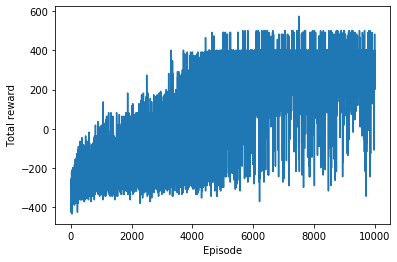

In [83]:
# Plot the learning

plt.plot(all_rewards)
plt.xlabel('Episode')
plt.ylabel('Total reward')
plt.show()


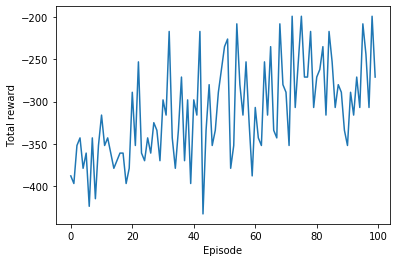

In [85]:
plt.plot(all_rewards[0:100])
plt.xlabel('Episode')
plt.ylabel('Total reward')
plt.show()

In [32]:
# Test what we have learned!

state = env.reset()

for i in np.arange(max_steps):
    action = np.argmax(Q[state]) # get the action
    next_state, reward, done, info = env.step(action) # take the action
    state = next_state # update the state
    
    print('Episode {}:'.format(i))
    env.render()
    

Episode 0:

###########################################################################################

info:
{'a) # packages in staging to start': 0,
 'b) # packages created': 0,
 'c) # packages in staging before action': 0,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': None,
 'f) action': 'down',
 'g) action result': 'successfully moved down',
 'h) # packages in staging after action': 0,
 'i) crane location after action': 'x = 0, y = 1',
 'j) package held by crane after action': None,
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = down

crane package = None

reward = -1

total reward = -1

warehouse stacks:
['.', '.']         ['.', '.']         ['.', '.']
['.', '.']         ['.', '.']         [

 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '3',
 'f) action': 'grab',
 'g) action result': 'cannot grab since holding something else',
 'h) # packages in staging after action': 4,
 'i) crane location after action': 'x = 0, y = 0',
 'j) package held by crane after action': '3',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 3

reward = -1

total reward = -113

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################
Episode 41:

######################

 'j) package held by crane after action': '3',
 'k) # packages in loading before trucks depart': 0,
 'l) # full loading stacks before trucks depart': 0,
 'm) # departed trucks': 0,
 'n) # packages in loading after trucks depart': 0,
 'o) # full loading stacks after trucks depart': 0,
 'p) total # full trucks that departed': 0}

action = grab

crane package = 3

reward = -1

total reward = -156

warehouse stacks:
['1', '1']         ['.', '.']         ['.', '.']
['1', '2']         ['.', '.']         ['.', '.']

###########################################################################################
Episode 84:

###########################################################################################

info:
{'a) # packages in staging to start': 4,
 'b) # packages created': 0,
 'c) # packages in staging before action': 4,
 'd) crane location before action': 'x = 0, y = 0',
 'e) package held by crane before action': '3',
 'f) action': 'grab',
 'g) action result': 'cannot grab since hol